# 首先引入所有需要的包

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import csv
import math
import random

import torch
import torch.nn as nn 
import torch.nn.functional as F
import torch.optim as optim

import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

from torch.autograd import Variable
from sklearn.preprocessing import MinMaxScaler

import scipy.signal as signal
from scipy.io import wavfile
import soundfile as sf
from pydub import AudioSegment

import io
import os
import math
import tarfile
import multiprocessing

import scipy
import librosa
import boto3
from botocore import UNSIGNED
from botocore.config import Config
import requests
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import time
from IPython.display import Audio, display

接下来设定一些样本数据的路径信息

In [3]:
_SAMPLE_DIR = "./_sample_data"
SAMPLE_WAV_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/steam-train-whistle-daniel_simon.wav"
SAMPLE_WAV_PATH = os.path.join(_SAMPLE_DIR, "steam.wav")

SAMPLE_WAV_SPEECH_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"
SAMPLE_WAV_SPEECH_PATH = os.path.join(_SAMPLE_DIR, "speech.wav")

SAMPLE_RIR_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/distant-16k/room-response/rm1/impulse/Lab41-SRI-VOiCES-rm1-impulse-mc01-stu-clo.wav"
SAMPLE_RIR_PATH = os.path.join(_SAMPLE_DIR, "rir.wav")

SAMPLE_NOISE_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/distant-16k/distractors/rm1/babb/Lab41-SRI-VOiCES-rm1-babb-mc01-stu-clo.wav"
SAMPLE_NOISE_PATH = os.path.join(_SAMPLE_DIR, "bg.wav")

SAMPLE_MP3_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/steam-train-whistle-daniel_simon.mp3"
SAMPLE_MP3_PATH = os.path.join(_SAMPLE_DIR, "steam.mp3")

SAMPLE_GSM_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/steam-train-whistle-daniel_simon.gsm"
SAMPLE_GSM_PATH = os.path.join(_SAMPLE_DIR, "steam.gsm")

SAMPLE_TAR_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit.tar.gz"
SAMPLE_TAR_PATH = os.path.join(_SAMPLE_DIR, "sample.tar.gz")
SAMPLE_TAR_ITEM = "VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"

S3_BUCKET = "pytorch-tutorial-assets"
S3_KEY = "VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"

YESNO_DATASET_PATH = os.path.join(_SAMPLE_DIR, "yes_no")
os.makedirs(YESNO_DATASET_PATH, exist_ok=True)
os.makedirs(_SAMPLE_DIR, exist_ok=True)

接下来定义函数用于获得这些数据

In [4]:
# def _fetch_data():
#   uri = [
#     (SAMPLE_WAV_URL, SAMPLE_WAV_PATH),
#     (SAMPLE_WAV_SPEECH_URL, SAMPLE_WAV_SPEECH_PATH),
#     (SAMPLE_RIR_URL, SAMPLE_RIR_PATH),
#     (SAMPLE_NOISE_URL, SAMPLE_NOISE_PATH),
#     (SAMPLE_MP3_URL, SAMPLE_MP3_PATH),
#     (SAMPLE_GSM_URL, SAMPLE_GSM_PATH),
#     (SAMPLE_TAR_URL, SAMPLE_TAR_PATH),
#   ]
#   for url, path in uri:
#     with open(path, 'wb') as file_:
#       file_.write(requests.get(url).content)
      
      
# # 执行这个函数
# _fetch_data()

下面定义用于下载yesNo数据集的函数并执行

In [5]:
def _download_yesno():
  if os.path.exists(os.path.join(YESNO_DATASET_PATH, "waves_yesno.tar.gz")):
    return
  torchaudio.datasets.YESNO(root=YESNO_DATASET_PATH, download=True)

# YESNO_DOWNLOAD_PROCESS = multiprocessing.Process(target=_download_yesno)
# YESNO_DOWNLOAD_PROCESS.start()

_download_yesno()

接下来定义数据集处理相关的函数

从给定路径 path 加载音频文件，并应用一些音频效果（包括将所有声道混合成单声道和可选的重采样）

In [6]:
def _get_sample(path, resample=None):
  effects = [
    ["remix", "1"]
  ]
  if resample:
    effects.extend([
      ["lowpass", f"{resample // 2}"],
      ["rate", f'{resample}'],
    ])
  return torchaudio.sox_effects.apply_effects_file(path, effects=effects)

获取预处理后的说话语音样本。它通过调用 _get_sample 函数来实现

In [7]:
def get_speech_sample(*, resample=None):
  return _get_sample(SAMPLE_WAV_SPEECH_PATH, resample=resample)

获取预处理后的噪声语音样本。它通过调用 _get_sample 函数来实现

In [8]:
def get_sample(*, resample=None):
  return _get_sample(SAMPLE_WAV_PATH, resample=resample)

从预定义路径 SAMPLE_RIR_PATH 获取房间脉冲响应（Room Impulse Response，RIR，直接声音和反映声音）样本，并根据参数决定是否对其进行处理。

In [9]:
def get_rir_sample(*, resample=None, processed=False):
  rir_raw, sample_rate = _get_sample(SAMPLE_RIR_PATH, resample=resample)
  if not processed:
    return rir_raw, sample_rate
  rir = rir_raw[:, int(sample_rate*1.01):int(sample_rate*1.3)]
  rir = rir / torch.norm(rir, p=2)
  rir = torch.flip(rir, [1])
  return rir, sample_rate

获得噪声数据集的函数

In [10]:
def get_noise_sample(*, resample=None):
  return _get_sample(SAMPLE_NOISE_PATH, resample=resample)

打印给定音频波形的各种统计信息

In [11]:
def print_stats(waveform, sample_rate=None, src=None):
  if src:
    print("-" * 10)
    print("Source:", src)
    print("-" * 10)
  if sample_rate:
    print("Sample Rate:", sample_rate)
  print("Shape:", tuple(waveform.shape))
  print("Dtype:", waveform.dtype)
  print(f" - Max:     {waveform.max().item():6.3f}")
  print(f" - Min:     {waveform.min().item():6.3f}")
  print(f" - Mean:    {waveform.mean().item():6.3f}")
  print(f" - Std Dev: {waveform.std().item():6.3f}")
  print()
  print(waveform)
  print()

绘制波形图

In [12]:
def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].plot(time_axis, waveform[c], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
  figure.suptitle(title)
  plt.show(block=False)

绘制波形频谱图

In [13]:
def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].specgram(waveform[c], Fs=sample_rate)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
  figure.suptitle(title)
  plt.show(block=False)

In [14]:
def play_audio(waveform, sample_rate):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(waveform[0], rate=sample_rate))
  elif num_channels == 2:
    display(Audio((waveform[0], waveform[1]), rate=sample_rate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

In [15]:
def inspect_file(path):
  print("-" * 10)
  print("Source:", path)
  print("-" * 10)
  print(f" - File size: {os.path.getsize(path)} bytes")
  print(f" - {torchaudio.info(path)}")


In [16]:
def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Spectrogram (db)')
  axs.set_ylabel(ylabel)
  axs.set_xlabel('frame')
  im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
  if xmax:
    axs.set_xlim((0, xmax))
  fig.colorbar(im, ax=axs)
  plt.show(block=False)

In [17]:
def plot_mel_fbank(fbank, title=None):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Filter bank')
  axs.imshow(fbank, aspect='auto')
  axs.set_ylabel('frequency bin')
  axs.set_xlabel('mel bin')
  plt.show(block=False)

In [18]:
def get_spectrogram(
    n_fft = 400,
    win_len = None,
    hop_len = None,
    power = 2.0,
):
  waveform, _ = get_speech_sample()
  spectrogram = T.Spectrogram(
      n_fft=n_fft,
      win_length=win_len,
      hop_length=hop_len,
      center=True,
      pad_mode="reflect",
      power=power,
  )
  return spectrogram(waveform)

In [19]:
def plot_pitch(waveform, sample_rate, pitch):
  figure, axis = plt.subplots(1, 1)
  axis.set_title("Pitch Feature")
  axis.grid(True)

  end_time = waveform.shape[1] / sample_rate
  time_axis = torch.linspace(0, end_time,  waveform.shape[1])
  axis.plot(time_axis, waveform[0], linewidth=1, color='gray', alpha=0.3)

  axis2 = axis.twinx()
  time_axis = torch.linspace(0, end_time, pitch.shape[1])
  ln2 = axis2.plot(
      time_axis, pitch[0], linewidth=2, label='Pitch', color='green')

  axis2.legend(loc=0)
  plt.show(block=False)

In [20]:
def plot_kaldi_pitch(waveform, sample_rate, pitch, nfcc):
  figure, axis = plt.subplots(1, 1)
  axis.set_title("Kaldi Pitch Feature")
  axis.grid(True)

  end_time = waveform.shape[1] / sample_rate
  time_axis = torch.linspace(0, end_time,  waveform.shape[1])
  axis.plot(time_axis, waveform[0], linewidth=1, color='gray', alpha=0.3)

  time_axis = torch.linspace(0, end_time, pitch.shape[1])
  ln1 = axis.plot(time_axis, pitch[0], linewidth=2, label='Pitch', color='green')
  axis.set_ylim((-1.3, 1.3))

  axis2 = axis.twinx()
  time_axis = torch.linspace(0, end_time, nfcc.shape[1])
  ln2 = axis2.plot(
      time_axis, nfcc[0], linewidth=2, label='NFCC', color='blue', linestyle='--')

  lns = ln1 + ln2
  labels = [l.get_label() for l in lns]
  axis.legend(lns, labels, loc=0)
  plt.show(block=False)

In [21]:
DEFAULT_OFFSET = 201
SWEEP_MAX_SAMPLE_RATE = 48000
DEFAULT_LOWPASS_FILTER_WIDTH = 6
DEFAULT_ROLLOFF = 0.99
DEFAULT_RESAMPLING_METHOD = 'sinc_interpolation'

In [22]:
def _get_log_freq(sample_rate, max_sweep_rate, offset):
  """Get freqs evenly spaced out in log-scale, between [0, max_sweep_rate // 2]

  offset is used to avoid negative infinity `log(offset + x)`.

  """
  half = sample_rate // 2
  start, stop = math.log(offset), math.log(offset + max_sweep_rate // 2)
  return torch.exp(torch.linspace(start, stop, sample_rate, dtype=torch.double)) - offset

In [23]:
def _get_inverse_log_freq(freq, sample_rate, offset):
  """Find the time where the given frequency is given by _get_log_freq"""
  half = sample_rate // 2
  return sample_rate * (math.log(1 + freq / offset) / math.log(1 + half / offset))

In [24]:
def _get_freq_ticks(sample_rate, offset, f_max):
  # Given the original sample rate used for generating the sweep,
  # find the x-axis value where the log-scale major frequency values fall in
  time, freq = [], []
  for exp in range(2, 5):
    for v in range(1, 10):
      f = v * 10 ** exp
      if f < sample_rate // 2:
        t = _get_inverse_log_freq(f, sample_rate, offset) / sample_rate
        time.append(t)
        freq.append(f)
  t_max = _get_inverse_log_freq(f_max, sample_rate, offset) / sample_rate
  time.append(t_max)
  freq.append(f_max)
  return time, freq

In [25]:
def plot_sweep(waveform, sample_rate, title, max_sweep_rate=SWEEP_MAX_SAMPLE_RATE, offset=DEFAULT_OFFSET):
  x_ticks = [100, 500, 1000, 5000, 10000, 20000, max_sweep_rate // 2]
  y_ticks = [1000, 5000, 10000, 20000, sample_rate//2]

  time, freq = _get_freq_ticks(max_sweep_rate, offset, sample_rate // 2)
  freq_x = [f if f in x_ticks and f <= max_sweep_rate // 2 else None for f in freq]
  freq_y = [f for f in freq if f >= 1000 and f in y_ticks and f <= sample_rate // 2]

  figure, axis = plt.subplots(1, 1)
  axis.specgram(waveform[0].numpy(), Fs=sample_rate)
  plt.xticks(time, freq_x)
  plt.yticks(freq_y, freq_y)
  axis.set_xlabel('Original Signal Frequency (Hz, log scale)')
  axis.set_ylabel('Waveform Frequency (Hz)')
  axis.xaxis.grid(True, alpha=0.67)
  axis.yaxis.grid(True, alpha=0.67)
  figure.suptitle(f'{title} (sample rate: {sample_rate} Hz)')
  plt.show(block=True)


In [26]:
def get_sine_sweep(sample_rate, offset=DEFAULT_OFFSET):
    max_sweep_rate = sample_rate
    freq = _get_log_freq(sample_rate, max_sweep_rate, offset)
    delta = 2 * math.pi * freq / sample_rate
    cummulative = torch.cumsum(delta, dim=0)
    signal = torch.sin(cummulative).unsqueeze(dim=0)
    return signal

In [27]:
def benchmark_resample(
    method,
    waveform,
    sample_rate,
    resample_rate,
    lowpass_filter_width=DEFAULT_LOWPASS_FILTER_WIDTH,
    rolloff=DEFAULT_ROLLOFF,
    resampling_method=DEFAULT_RESAMPLING_METHOD,
    beta=None,
    librosa_type=None,
    iters=5
):
  if method == "functional":
    begin = time.time()
    for _ in range(iters):
      F.resample(waveform, sample_rate, resample_rate, lowpass_filter_width=lowpass_filter_width,
                 rolloff=rolloff, resampling_method=resampling_method)
    elapsed = time.time() - begin
    return elapsed / iters
  elif method == "transforms":
    resampler = T.Resample(sample_rate, resample_rate, lowpass_filter_width=lowpass_filter_width,
                           rolloff=rolloff, resampling_method=resampling_method, dtype=waveform.dtype)
    begin = time.time()
    for _ in range(iters):
      resampler(waveform)
    elapsed = time.time() - begin
    return elapsed / iters
  elif method == "librosa":
    waveform_np = waveform.squeeze().numpy()
    begin = time.time()
    for _ in range(iters):
      librosa.resample(waveform_np, sample_rate, resample_rate, res_type=librosa_type)
    elapsed = time.time() - begin
    return elapsed / iters

数据可视化

Sample Rate: 16000
Shape: (1, 5898240)
Dtype: torch.float32
 - Max:      0.248
 - Min:     -0.294
 - Mean:     0.000
 - Std Dev:  0.027

tensor([[ 0.0196,  0.0195,  0.0195,  ..., -0.0112, -0.0112, -0.0122]])



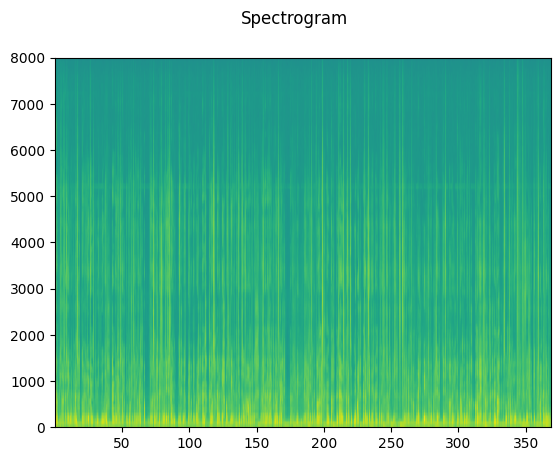

In [28]:
#@title Visualizing Data
# waveform, sample_rate = torchaudio.load("/content/drive/MyDrive/Work/MCRL/stutter/data/uclass/audio/F_0050_10y9m_1.wav")
waveform, sample_rate = torchaudio.load("./data/uclass/audio/F_0050_10y9m_1.wav")

print_stats(waveform, sample_rate=16000)
#plot_waveform(waveform, sample_rate)
plot_specgram(waveform, 16000)
play_audio(waveform, 16000)

In [29]:
#@title Libristutter —ALL APPEARANCES— Data Generation, Storage { form-width: "10%" }
# Libristutter audio file --> audio clips(the 4 seconds around all appearances of stutters) --> spectrogram --> storage
# all images saved to "/contents/data/images/" in google drive root
def graph_spectrogram(wav_file):
    rate, data = wavfile.read(wav_file)
    fig,ax = plt.subplots(1)
    fig.subplots_adjust(left=0,right=1,bottom=0,top=1)
    ax.axis('off')
    pxx, freqs, bins, im = ax.specgram(x=data, Fs=16000, noverlap=128, NFFT=256)
    ax.axis('off')
    #fig.savefig('sp_xyz.png', dpi=300, frameon='false')

初始设置，指明libristutter的路径，以及部分

In [30]:
data_location = "./data/libristutter/"
# parts = ['partA'] #['partA', 'partB', 'partC']
parts = ['partA', 'partB', 'partC']
#!rm -r /content/drive/MyDrive/Work/MCRL/stutter/data/libristutter/clips
#!rm -r /content/drive/MyDrive/data/imagesA/
#!rm -r /content/drive/MyDrive/data/imagesB/
#!rm -r /content/drive/MyDrive/data/imagesC/

In [31]:
# # 遍历每个部分，
# # speakerIDs获取并排序说话者的ID
# # speakerIDNum这里是尝试获取特定说话者87的索引
# # SpeakerID这是根据索引获得的当前说话者的ID
# for part in parts:
#   speakerIDs = sorted(os.listdir(data_location + part + "/" + "audio/")) # speaker ID numbers array
#   # speakerIDNum = speakerIDs.index('87') #0 # math.ceil(0.8 * (len(speakerIDs)-1)) # this convoluted to start with j test data creation, normally 0
#   speakerIDNum =  math.ceil(0.8 * (len(speakerIDs)-1))
#   speakerID = speakerIDs[speakerIDNum]
#   for id in speakerIDs: print(id)


#   # 遍历说话者的章节
#   chapters = sorted(os.listdir(data_location + part + "/" + "audio/" + speakerID)) # chapter numbers array
#   chapterNum = 0 #math.ceil(0.8 * (len(chapters)-1)) # 0
#   chapter = chapters[chapterNum]

#   # 遍历说话者的短语
#   phrases = sorted(os.listdir(data_location + part + "/" + "audio" + "/" + speakerID + "/" + chapter)) # audio file names array (all .flac)
#   phraseNum = 0#math.ceil(0.8 * (len(phrases)-1)) # 0
#   phrase = phrases[phraseNum]

#   # 设置输出路径和数据分割参数
#   annotation_name = phrase[:-5] + ".csv"  # 生成当前短语的注释文件路径
#   annotation_location = data_location + part + "/" + "annotations/" + speakerID + "/" + chapter + "/" + annotation_name


#   train_location = f"./dataset/{'images' + part[-1]}/train/"  # 设置训练和测试数据集的输出路径
#   test_location = f"./dataset/{'images' + part[-1]}/test/"
#   clips_location = "./data/libristutter/clips/"   # 设置剪辑文件的输出路径

#   dataTrainPctg = 0.8   # swaps to test_location when 80% of data has been put in train/

#   partition_spec_loc = train_location # 设置初始输出路径为训练数据
#   lump_loc = "./dataset/libriAll/"
#   lump_spec_loc = lump_loc + "train/"

#   # 遍历所有的说话者、章节和短语
#   while speakerIDNum < len(speakerIDs): # 遍历所有说话者
#     print("\nCREATING TRAINING IMAGES\n")
#     while chapterNum < len(chapters):  # 遍历章节
#       while phraseNum < len(phrases):  # 遍历短语
#         # 检查数据分割：如果超过训练数据的比例，将采用测试数据的输出路径
#         if speakerIDNum > len(speakerIDs) * dataTrainPctg and partition_spec_loc != test_location:
#           partition_spec_loc = test_location
#           lump_spec_loc = lump_loc + "test/"
#           print("""\n\n\nDONE WITH CREATING TRAINING IMAGES\nCREATING TESTING IMAGES\n\n\n""")
        
#         file_name = phrase
#         file_location = data_location + part + "/" + "audio/" + speakerID + "/" + chapter + "/" + file_name

#         annotation_name = phrase[:-5] + ".csv"
#         annotation_location = data_location + part + "/" + "annotations/" + speakerID + "/" + chapter + "/" + annotation_name
#         stutterRows = []

#         # 读取当前短语对应的注释文件，并存储所有包含了口吃的行
#         with open(annotation_location, newline='') as csvfile: # open annotations for current file
        
#           spamreader = csv.reader(csvfile, delimiter=' ', quotechar='|')
#           data = list(spamreader)
#           rowCount = len(data)
#           stutterRowInd = 0
#           foundStutters = 0

#           print(f'Loc: {file_location}')
#           # 处理注释文件中每一行包含的口吃信息，并解析存储到stutterRows列表中
#           for row in data: # finds first appearance of stutter in the csv annotation just opened and stores that row in stutterRows
#             row = row[0].split(",")
#             if len(row) == 4 and row[3] != '0':
#               stutterRows.append(row)
#               for cellInd in range(len(stutterRows[foundStutters])): 
#                 if cellInd > 0: 
#                   stutterRows[foundStutters][cellInd] = float(stutterRows[foundStutters][cellInd])
#                 cellInd += 1
#               print(f'  Row: {str(row[0])}, {str(int(row[3]))}, {str(row[1])}, {str(row[2])}') # STUTTER, TYPE, START, END
#               foundStutters += 1
#             stutterRowInd += 1
            
#         csvfile.close()
#         print(f'  StutterRows: {stutterRows}')
        
#         # 生成音频剪辑和频谱图
#         audio = AudioSegment.from_file(file_location) # create audiosegment object from the full .flac file
#         if audio.duration_seconds * 1000 >= 4000:
          
#           # 处理无口吃的音频文件
#           if len(stutterRows) == 0: # if file had no stutters
#             print(f'\nCLEAN FOUND @: {file_location}\n')
#             full_length = int(audio.duration_seconds *  1000)
#             cleanInd = 0
#             for cleanChunk in range(math.floor(audio.duration_seconds * 1000 / 4000)):
#               cleanInd += 1
#               print(f'  Creating {cleanInd} clean clip here')
#               cleanStart = cleanChunk * 4000
#               cleanEnd = cleanStart + 4000
#               stutterType = 0
#               stutterClip = audio[cleanStart:cleanEnd]
#               print(f'    Stutter-Free Clip Start and End: {cleanStart}, {cleanEnd}')

#               clipName = clips_location + part + "/" + file_name[:-5] + "_" + str(cleanInd) + ".flac"
#               exportClip = AudioSegment.empty() # only way I know how to do this at the moment, make a new empty audioseg, append the stutter clip to it w/ no fade-in
#               exportClip = exportClip.append(stutterClip, crossfade = 0)
#               os.makedirs(os.path.dirname(clipName), exist_ok=True) # in case it doesn't exist, create the dir where image will be stored
#               exportClip.export(clipName, format="wav")

#               # spectrogram creation
#               file_part_name = partition_spec_loc + str(stutterType) + "/" + file_name[:-5]  + "_" + str(cleanInd) + ".png" # strip .flac and direct images to content/data/[STUTTER TYPE]/[FILE NAME]
#               file_lump_name = lump_spec_loc + str(stutterType) + "/" + file_name[:-5] + "_" + str(cleanInd) + ".png"
#               os.makedirs(os.path.dirname(file_part_name), exist_ok=True) # in case it doesn't exist, create the dir where image will be stored
#               os.makedirs(os.path.dirname(file_lump_name), exist_ok=True) # in case it doesn't exist, create the dir where image will be stored
              
#               # 保存音频剪辑结果和频谱图到指定的路径
#               graph_spectrogram(clipName) # graph, save, close
#               plt.savefig(file_part_name)
#               plt.savefig(file_lump_name)
#               plt.close()
#             csvfile.close()

#           # 处理有口吃的片段
#           else: # if the file had stutters
#             rowInd = 0
#             # 对于每个找到的口吃片段， 生成一个4s长的音频剪辑，并且保存为flac格式
#             for stutterRow in stutterRows:
#               audio = AudioSegment.from_file(file_location) # create audiosegment object from the full .flac file
#               rowInd += 1
#               stutterStart = stutterRow[1] * 1000 # convert to milliseconds for pydub AudioSegment module
#               stutterEnd = stutterRow[2] * 1000
#               stutterDurr = stutterEnd - stutterStart
#               timeLeft = 4000 - stutterDurr
#               halfLeft = timeLeft / 2
#               stutterType = int(stutterRow[3])
#               start = 0
#               end = 4000
#               #print(f'    Stutter Clip init Start and End: {stutterStart}, {stutterEnd}')
#               #print(f'    Half left: {halfLeft}')

#               if timeLeft >= 0: # if we need to add time to the clip to make it 4 seconds long
#                 # here we know the amount we'd half to add to each side of the clip to make it 4 seconds long(halfLeft)
#                 # and we are checking if we can take of that amount without going outside the bounds of the whole clip
#                 # if we go out of them as in the first two ifs, then that means we are either at the end or the start
#                 # in those cases, take the first 4 seconds or the last 4, respectively
#                 # otherwise take the clip from start-halfLeft to end+halfLeft
#                 if stutterStart - halfLeft < 0: # if the stutter is within the first 4 seconds
#                   start = 0
#                 elif stutterEnd + halfLeft > audio.duration_seconds * 1000: # if the stutter is within the last 4 seconds
#                   start = audio.duration_seconds * 1000 - 4000
#                 else: # if it's after the first 4 seconds and before the last 4
#                   start = stutterStart - halfLeft

#               end = start + 4000
#               stutterClip = audio[start:end]
#               print(f'    Stutter clip {rowInd} duration: start, end: ({start}, {end}); len: {stutterClip.duration_seconds * 1000}')

#               clipName = clips_location + part + "/" + file_name[:-5] + "_" + str(rowInd) + ".flac"
#               exportClip = AudioSegment.empty() # 创建一个空的AudioSegment对象
#               exportClip = exportClip.append(stutterClip, crossfade = 0)
#               os.makedirs(os.path.dirname(clipName), exist_ok=True) # 如果路径不存在那么就创建路径
#               exportClip.export(clipName, format="wav")

#               # spectrogram creation
#               # 为每一个音频剪辑生成一个频谱图，并且保存到训练或者是测试的数据路径里面
#               file_part_name = partition_spec_loc + str(stutterType) + "/" + file_name[:-5]  + "_" + str(rowInd) + ".png" # strip .flac and direct images to content/data/[STUTTER TYPE]/[FILE NAME]
#               file_lump_name = lump_spec_loc + str(stutterType) + "/" + file_name[:-5] + "_" + str(rowInd) + ".png"
#               os.makedirs(os.path.dirname(file_part_name), exist_ok=True) # 如果路径不存在那么就创建路径
#               os.makedirs(os.path.dirname(file_lump_name), exist_ok=True) # 如果路径不存在那么就创建路径
              
#               graph_spectrogram(clipName) # graph, save, close
#               plt.savefig(file_part_name)
#               plt.savefig(file_lump_name)
#               plt.close()
#         else:
#           print(f'\nFile at {file_location} is not at least 4 seconds. SKIPPED\n')

#         # 处理完成后的循环部分
#         phraseNum += 1  # 处理完一个章节的所有短语
#         if phraseNum < len(phrases):  # 如果还有短语，处理下一个短语
#           phrase = phrases[phraseNum]

#       chapterNum += 1 # 处理完当前章节
#       if chapterNum < len(chapters): # 如果还有章节，就处理下一个章节
#         chapter = chapters[chapterNum]
#         phrases = sorted(os.listdir(data_location + part + "/" + "audio" + "/" + speakerID + "/" + chapter)) # fetch the new phrases
#         phraseNum = 0
#         phrase = phrases[phraseNum]
      
#     speakerIDNum += 1 # 处理完当前说话者
#     if speakerIDNum < len(speakerIDs):  # 如果还有说话者，处理下一说话者
#       speakerID = speakerIDs[speakerIDNum]
#     chapterNum = 0
#     chapters = sorted(os.listdir(data_location + part + "/" + "audio/" + speakerID))
#     chapter = chapters[chapterNum]
#     phrases = sorted(os.listdir(data_location + part + "/" + "audio" + "/" + speakerID + "/" + chapter)) # fetch the new phrases
#     phraseNum = 0
#     phrase = phrases[phraseNum]

In [32]:
#@title Testing Libristutter Image Creation
def graph_spectrogram(wav_file):
    rate, data = wavfile.read(wav_file)
    fig,ax = plt.subplots(1)
    fig.subplots_adjust(left=0,right=1,bottom=0,top=1)
    ax.axis('off')
    pxx, freqs, bins, im = ax.specgram(x=data, Fs=16000, noverlap=128, NFFT=256)
    ax.axis('off')
    #fig.savefig('/content/example.png',, frameon='false')
    
    

0-class Image Before and After Clipping


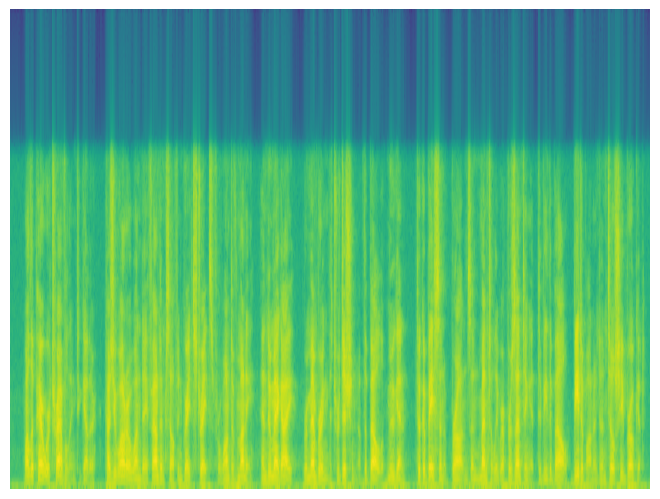

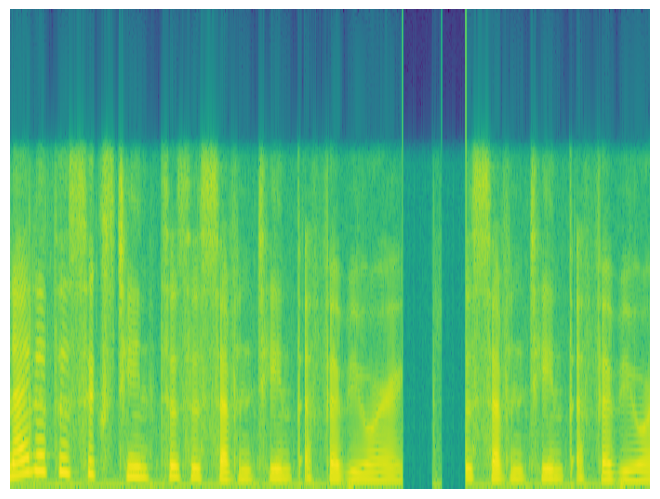

In [33]:
print(f'0-class Image Before and After Clipping')
graph_spectrogram("./data/libristutter/partB/audio/2952/407/2952-407-0021.flac")
graph_spectrogram("./data/libristutter/clips/partB/5393-19218-0000_1.flac")
#print(f'x-class Image Before and After Clipping')
#graph_spectrogram("/content/drive/MyDrive/Work/MCRL/stutter/data/libristutter/partA/audio/103/1240/103-1240-0000.flac")
#graph_spectrogram("/content/drive/MyDrive/Work/MCRL/stutter/data/libristutter/clips/partA/103-1240-0000_1.flac")

In [34]:
#@title UCLASS Data Generation -- ALL APPEARANCES { form-width: "10%", display-mode: "form" }
# UCLASS audio file --> audio clip(the 4 seconds around the first appearance of a stutter) --> spectrogram --> storage
# all images saved to "/contents/data/Uimages/" in google drive root
# aud_~~ = audio, annot_~~ = annotation, file_~~ = spectrogram
def graph_spectrogram(wav_file):
    rate, data = wavfile.read(wav_file)
    fig,ax = plt.subplots(1)
    fig.subplots_adjust(left=0,right=1,bottom=0,top=1)
    ax.axis('off')
    pxx, freqs, bins, im = ax.specgram(x=data, Fs=16000, noverlap=128, NFFT=256) # NFFT used to be 512, worked well supposedly 
    ax.axis('off')
    #fig.savefig('sp_xyz.png', dpi=300, frameon='false')

In [35]:
# data_location = "/content/drive/MyDrive/Work/MCRL/stutter/data/uclass/"
data_location = "./data/uclass/"
annotation_location = data_location + "annotations/"
audio_location = data_location + "audio/"

annot_files = sorted(os.listdir(data_location + "annotations/"))

train_location = "./dataset/uimages/train/"
test_location = "./dataset/uimages/test/"
clips_location = "./data/uclass/clips/"

In [36]:
part_spec_location = train_location

print("\nCREATING UCLASS VALIDATION IMAGES\n")
file_num = 1
pct_for_train = 0.8


CREATING UCLASS VALIDATION IMAGES



In [37]:
# for annot_name in annot_files:
#   if file_num > len(annot_files) * pct_for_train and part_spec_location != test_location:
#     part_spec_location = test_location
#     print("""\n\n\nDONE WITH CREATING TRAINING IMAGES\nCREATING TESTING IMAGES\n\n\n""")

#   curr_annot_location = annotation_location + annot_name
#   audio_name = annot_name[:-4] + ".wav"
#   curr_audio_location = audio_location + audio_name
#   stutterRows = []
#   print(f"\nStutter(s) @ file {file_num}'s Loc: {curr_annot_location}")
#   file_num += 1

#   with open(curr_annot_location, newline='', encoding='cp1252') as csvfile: # open annotations for current file
#     spamreader = csv.reader(csvfile, delimiter=',', quotechar='|')
#     #print(spamreader)
#     data = list(spamreader)
#     rowCount = len(data)
#     stutterRowInd = 0
#     foundStutters = 0
#     for row in data: # finds all rows indicated to contain a stutter and stores them in stutterRows
#       if row[7] != '0': # the 5th box contains boolean indicating a stutter or lack thereof
#         file_cont_st = True
#         stutterRows.append(row) # add the row containining the stutter
#         for cellInd in [2, 3]: 
#           stutterRows[foundStutters][cellInd] = float(stutterRows[foundStutters][cellInd]) # turn the numerical values in the csv boxes from strings into floats
#         for cellInd in [7]:
#           stutterRows[foundStutters][cellInd] = int(stutterRows[foundStutters][cellInd])
#         print(f'  Row {stutterRowInd}: {str(stutterRows[foundStutters])}')
#         foundStutters += 1
#       stutterRowInd += 1
  
#   csvfile.close()

#   if len(stutterRows) != 0: # if it had stutters, loop through each stutter-containing row
#     rowInd = 0
#     prevStutterEnd = stutterRows[0][3] * 1000
#     cleanGaps = 0
#     for stutterRow in stutterRows:
#       audio = AudioSegment.from_file(curr_audio_location) # create audiosegment object from the full .flac file
#       rowInd += 1
#       stutterStart = stutterRow[2] * 1000 # convert to milliseconds for pydub AudioSegment module
#       stutterEnd = stutterRow[3] * 1000
#       stutterDurr = stutterEnd - stutterStart
#       timeLeft = 4000 - stutterDurr
#       halfLeft = timeLeft / 2
#       stutterType = int(stutterRow[7])

#       if stutterStart - prevStutterEnd > 4000:
#         cleanGaps += 1
#         for chunkInd in range(math.floor((stutterStart - prevStutterEnd)/4000)):
#           start = stutterStart + chunkInd * 4000
#           end = start + 4000
#           stutterClip = audio[start: end]
#           print(f'      Clean UCLASS inter-clip {chunkInd + 1} range: ({start}, {end}); len: {stutterClip.duration_seconds * 1000}')

#           clip_name = f"{clips_location}/{audio_name[:-4]}_{cleanGaps}clean{chunkInd}.flac" # data/uimages/clips/~~~~~.wav (the 4 second audio clip files)
#           exportClip = AudioSegment.empty() # only way I know how to do this at the moment, make a new empty audioseg, append the stutter clip to it w/ no fade-in
#           exportClip = exportClip.append(stutterClip, crossfade = 0)
#           os.makedirs(os.path.dirname(clip_name), exist_ok=True) # in case it doesn't exist, create the dir where image will be stored
#           exportClip.export(clip_name, format="wav")

#           # spectrogram creation
#           file_result_name = f"{part_spec_location}0/{audio_name[:-4]}_{cleanGaps}clean{rowInd}.png" # strip .wav and direct images to content/data/[STUTTER TYPE]/[FILE NAME]
#           os.makedirs(os.path.dirname(file_result_name), exist_ok=True) # in case it doesn't exist, create the dir where image will be stored
          
#           #print(f'Clip name: {clip_name}')
#           graph_spectrogram(clip_name) # graph, save, close # used to be file_location
#           plt.savefig(file_result_name)
#           plt.close()

#       if timeLeft >= 0: # if we need to add time to the clip to make it 4 seconds long
#         # here we know the amount we'd half to add to each side of the clip to make it 4 seconds long(halfLeft)
#         # and we are checking if we can take of that amount without going outside the bounds of the whole clip
#         # if we go out of them as in the first two ifs, then that means we are either at the end or the start
#         # in those cases, take the first 4 seconds or the last 4, respectively
#         # otherwise take the clip from start-halfLeft to end+halfLeft
#         if stutterStart - halfLeft < 0: # if the stutter is within the first 4 seconds
#           start = 0
#           end = 4000
#         elif stutterEnd + halfLeft > audio.duration_seconds * 1000: # if the stutter is within the last 4 seconds
#           start = audio.duration_seconds * 1000 - 4000
#           end = start + 4000
#         else: # if it's after the first 4 seconds and before the last 4
#           start = stutterStart - halfLeft
#           end = stutterEnd + halfLeft

#       stutterClip = audio[start:end]
#       print(f'    Stutter clip {rowInd} range: ({start}, {end}); len: {stutterClip.duration_seconds * 1000}')

#       clip_name = clips_location + "/" + audio_name[:-4] + "_" + str(rowInd) + ".flac" # data/uimages/clips/~~~~~.wav (the 4 second audio clip files)
#       exportClip = AudioSegment.empty() # only way I know how to do this at the moment, make a new empty audioseg, append the stutter clip to it w/ no fade-in
#       exportClip = exportClip.append(stutterClip, crossfade = 0)
#       os.makedirs(os.path.dirname(clip_name), exist_ok=True) # in case it doesn't exist, create the dir where image will be stored
#       exportClip.export(clip_name, format="wav")

#       # spectrogram creation
#       file_result_name = part_spec_location + str(stutterType) + "/" + audio_name[:-4] + "_" + str(rowInd) + ".png" # strip .wav and direct images to content/data/[STUTTER TYPE]/[FILE NAME]
#       os.makedirs(os.path.dirname(file_result_name), exist_ok=True) # in case it doesn't exist, create the dir where image will be stored
      
#       #print(f'Clip name: {clip_name}')
#       graph_spectrogram(clip_name) # graph, save, close # used to be file_location
#       plt.savefig(file_result_name)
#       plt.close()

#       prevStutterEnd = stutterEnd

In [38]:
#@title Testing UCLASS Image Creation
def graph_spectrogram(wav_file):
    rate, data = wavfile.read(wav_file)
    fig,ax = plt.subplots(1)
    fig.subplots_adjust(left=0,right=1,bottom=0,top=1)
    ax.axis('off')
    pxx, freqs, bins, im = ax.specgram(x=data, Fs=16000, noverlap=128, NFFT=256) # NFFT used to be 512, worked well supposedly 
    ax.axis('off')
    #fig.savefig('sp_xyz.png', dpi=300, frameon='false')

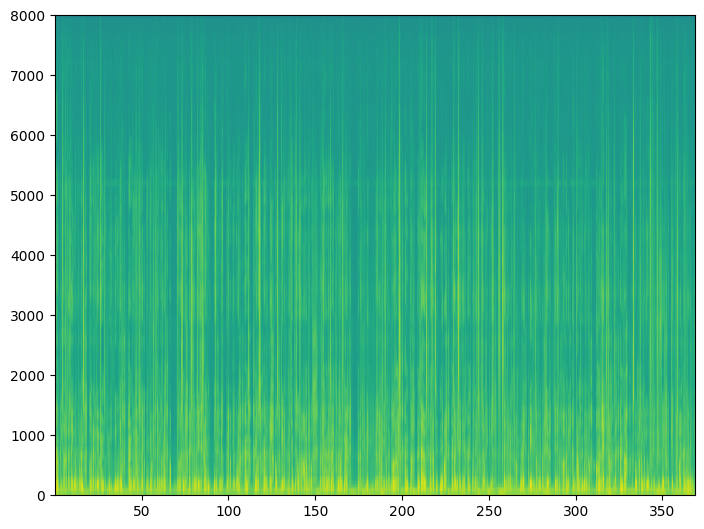

In [39]:
rate, data = wavfile.read("./data/uclass/audio/F_0050_10y9m_1.wav")
fig,ax = plt.subplots(1)
fig.subplots_adjust(left=0,right=1,bottom=0,top=1)
#ax.axis('off')
pxx, freqs, bins, im = ax.specgram(x=data, Fs=16000, noverlap=128, NFFT=256) # NFFT used to be 512, worked well supposedly 

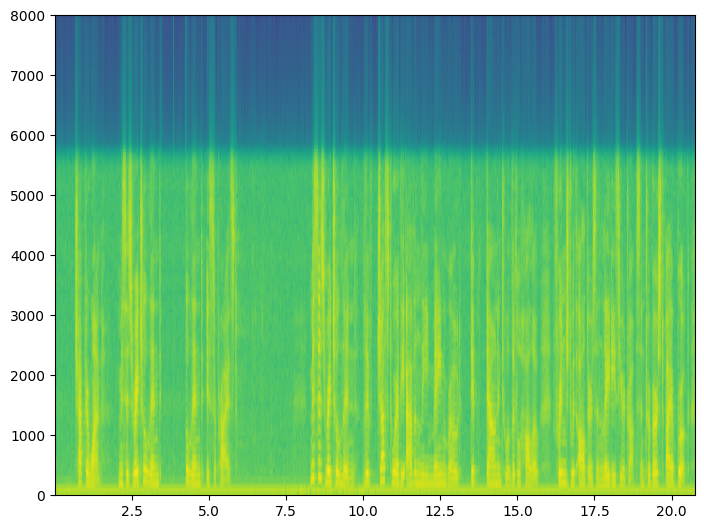

In [40]:
rate2, data2 = wavfile.read("./data/libristutter/partA/audio/103/1240/103-1240-0000.flac")
fig2,ax2 = plt.subplots(1)
fig2.subplots_adjust(left=0,right=1,bottom=0,top=1)
pxx, freqs, bins, im = ax2.specgram(x=data2, Fs=16000, noverlap=128, NFFT=256)
plt.show()

# 接下来是模型的部分

In [1]:
#@title Visualize Data (for debugging) { run: "auto", display-mode: "form" }
def visualize_data(input, title=None):
    input = input.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    input = std * input + mean
    input = np.clip(input, 0, 1)
    plt.imshow(input)

    if title is not None:
       plt.title(None) # remove titles

    plt.pause(0.001)  ## Here we are pausing a bit so that plots are updated

In [2]:

# inputs_data, classes = next(iter(loaders_data['train']))

# ## This is the code for getting a batch of training data
# out = torchvision.utils.make_grid(inputs_data)

import wandb

print(dir(wandb))
wandb.login()


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


['AlertLevel', 'Api', 'Artifact', 'ArtifactTTL', 'Audio', 'Classes', 'CommError', 'Config', 'Error', 'Graph', 'Histogram', 'Html', 'Image', 'InternalApi', 'JoinedTable', 'Molecule', 'Object3D', 'Optional', 'Plotly', 'PublicApi', 'START_TIME', 'Settings', 'Table', 'UsageError', 'Video', '_IS_INTERNAL_PROCESS', '_Sentry', '__all__', '__annotations__', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', '_assert_is_internal_process', '_assert_is_user_process', '_attach', '_cleanup_media_tmp_dir', '_globals', '_lazyloader', '_preinit', '_sentry', '_set_internal_process', '_sync', '_teardown', '_wandb_module', 'agent', 'agents', 'alert', 'analytics', 'api', 'apis', 'attach', 'catboost', 'config', 'controller', 'data_types', 'define_metric', 'docker', 'ensure_configured', 'env', 'errors', 'filesync', 'finish', 'get_ipython', 'gym', 'helper', 'init', 'integration', 'join', 'jupyter', 'keras', 'lightgbm', 'link_mo

wandb: Currently logged in as: hit_bin (hit_bin-harbin-insititue-of-technology). Use `wandb login --relogin` to force relogin


True

In [3]:
#@title Import Libraries { run: "auto", display-mode: "form" }
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import csv
import math
import time
import copy
import gc
plt.ion() 

import torch
import torch.nn as nn 
import torch.nn.functional as F

import torch.hub
from torch.utils.data import Subset

import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
from torchvision import datasets, models, transforms
from torchvision.models.feature_extraction import get_graph_node_names
from torchvision.models.feature_extraction import create_feature_extractor

import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

#from torchsummary import summary
from torchinfo import summary

from torch.autograd import Variable
from sklearn.preprocessing import MinMaxScaler

import scipy.signal as signal
from scipy.io import wavfile
import soundfile as sf


# imports the torch_xla package -- TPU
#import torch_xla
#import torch_xla.core.xla_model as xm

网络

In [4]:
#@title SERN Class and Creation Methods { form-width: "10%" }
# SEResNet Class
# From: https://github.com/StickCui/PyTorch-SE-ResNet/blob/master/model/model.py

class SEResNet(nn.Module):
    def __init__(self, block, layers, num_classes=1000):
        self.inplanes = 64
        super(SEResNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)
        self.avgpool = nn.AvgPool2d(7)
        self.fc = nn.Linear(512 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def _make_layer(self, block, planes, blocks, stride=1):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample))
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)

        return x


class Bottleneck(nn.Module): # what is this ....
    expansion = 4

    def __init__(self, inplanes, planes, stride=1, downsample=None):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(inplanes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=stride,
                               padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, planes * 4, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(planes * 4)
        self.relu = nn.ReLU(inplace=True)
        # SE
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.conv_down = nn.Conv2d(
            planes * 4, planes // 4, kernel_size=1, bias=False)
        self.conv_up = nn.Conv2d(
            planes // 4, planes * 4, kernel_size=1, bias=False)
        self.sig = nn.Sigmoid()
        # Downsample
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        out1 = self.global_pool(out)
        out1 = self.conv_down(out1)
        out1 = self.relu(out1)
        out1 = self.conv_up(out1)
        out1 = self.sig(out1)

        if self.downsample is not None:
            residual = self.downsample(x)

        res = out1 * out + residual
        res = self.relu(res)

        return res


def se_resnet50(**kwargs):
    """Constructs a SE-ResNet-50 model.
    Args:
        num_classes = 1000 (default)
    """
    model = SEResNet(Bottleneck, [3, 4, 6, 3], **kwargs)
    return model


def se_resnet101(**kwargs):
    """Constructs a SE-ResNet-101 model.
    Args:
        num_classes = 1000 (default)
    """
    model = SEResNet(Bottleneck, [3, 4, 23, 3], **kwargs)
    return model


def se_resnet152(**kwargs):
    """Constructs a SE-ResNet-152 model.
    Args:
        num_classes = 1000 (default)
    """
    model = SEResNet(Bottleneck, [3, 8, 36, 3], **kwargs)
    return model




In [5]:
torch.cuda.empty_cache()

In [6]:
# #@title Dataloading & Hyperparams: One vs All { run: "auto", form-width: "12%", display-mode: "both" }
# # SERN Data & Dataloading for the 4-second snippet spectrograms, unchanged
# # OVA dataloading
# data_loc = "./dataset/libriAll/" 

# SERN_transform = transforms.Compose([transforms.ToTensor()]) # array of transformations necessary for ImageFolder & PyTorch

# # hyperparameters
# num_epochs = 30
# learning_rate = 1e-1
# num_layers = 1
# batch_size = 16
# LSTM_dropout = 0.2

# # immutable, data-specific parameters for the audo images
# input_size = 3 * 288 * 432 # number of features in each data point we are processing
# sequence_length = 1 # size of each image we are processing
# num_classes = 2
# hidden_size = 2 # size of the output that we are generating

# transforming_spec_data = {

#     'train': transforms.Compose([
#           transforms.ToTensor(),
#     ]),

#     'test': transforms.Compose([
#           transforms.ToTensor(),
    
# ]),

# }

# # part = "A"
# ### 
# classes = ['0', '2', '3', '4', '5']
# foc_class = '2' # class the model will focus on learning to classify
# other_class = '-1'

# # ovsa_data_loc = f"/content/drive/MyDrive/data/libri{part}{foc_class}va/" # {class _}va = class _ versus network, one vs all
# ovsa_data_loc = f"./dataset/libri{foc_class}va/" # {class _}va = class _ versus network, one vs all

# os.makedirs(os.path.dirname(f'{ovsa_data_loc}'), exist_ok=True)
# oc_train_dest = f'{ovsa_data_loc}train/a/' # other classes train destination
# fc_train_dest = f'{ovsa_data_loc}train/f/' # other classes test destination
# oc_test_dest = f'{ovsa_data_loc}test/a/'
# fc_test_dest = f'{ovsa_data_loc}test/f/'

# #os.makedirs(os.path.dirname(oc_train_dest), exist_ok=True)
# #os.makedirs(os.path.dirname(fc_train_dest), exist_ok=True) 
# #os.makedirs(os.path.dirname(oc_test_dest), exist_ok=True)
# #os.makedirs(os.path.dirname(fc_test_dest), exist_ok=True)

# import shutil, errno
# from distutils.dir_util import copy_tree

# def copy_r(src, dst):
#   try:
#     shutil.copytree(src, dst)
#   except OSError as exc: # python >2.5
#     if exc.errno in (errno.ENOTDIR, errno.EINVAL):
#       shutil.copy(src, dst)
#     else: raise


# if len(os.listdir(ovsa_data_loc)) == 0:
#   for other_class in classes:
#     if other_class != foc_class: 
#       oc_origin_train_loc = data_loc + "train/" + other_class + "/."
#       oc_origin_test_loc = data_loc + "test/" + other_class + "/."
#       copy_tree(oc_origin_train_loc, oc_train_dest)
#       copy_tree(oc_origin_test_loc, oc_test_dest)
#     else:
#       fc_origin_train_loc = data_loc + "train/" + foc_class + "/."
#       fc_origin_test_loc = data_loc + "test/" + foc_class + "/."
#       copy_tree(fc_origin_train_loc, fc_train_dest)
#       copy_tree(fc_origin_test_loc, fc_test_dest)


# all_dataset_classes = {x: datasets.ImageFolder(os.path.join(ovsa_data_loc, x), 

#                                            transforming_spec_data[x])

#                    for x in ['train', 'test']}

# # establish classes & their corresponding stutters from each database
# lclasses = {
#     '0' : 'c',
#     '1' : 'i',
#     '2' : 'sr',
#     '3' : 'wr',
#     '4' : 'pr',
#     '5' : 'p'
# }
# uclasses = {
#     '0' : 'c',
#     '1' : 'i',
#     '2' : 'sr',
#     '3' : 'pwr',
#     '4' : 'wr',
#     '5' : 'pr',
#     '6' : 'rv',
#     '7' : 'p'
# }

# classes = ['f', 'a']


# # select the indices of all other folders
# datasets_images = {}

# """for key, dataset in all_dataset_classes.items():
#   idx = [i for i in range(len(dataset)) if dataset.imgs[i][1] == dataset.class_to_idx[classes[0]] or dataset.imgs[i][1] == dataset.class_to_idx[classes[1]]]
#   # build the appropriate subset
#   datasets_images[key] = Subset(dataset, idx)
# """

# for key, dataset in all_dataset_classes.items():
#   idx =  [i for i in range(len(dataset))]
#   datasets_images[key] = Subset(dataset, idx)

# loaders_data = {x: torch.utils.data.DataLoader(datasets_images[x], batch_size=batch_size,
#                                              shuffle=True, num_workers=4) # what is num_workers?

#                for x in ['train', 'test']}


# sizes_datasets = {x: len(datasets_images[x]) for x in ['train', 'test']}

# class_names = classes

# torch.cuda.empty_cache()
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# #xm.xla_device(devkind='TPU' )

In [7]:
data_loc = "./dataset/libriAll/" 

SERN_transform = transforms.Compose([transforms.ToTensor()]) # array of transformations necessary for ImageFolder & PyTorch

# hyperparameters
num_epochs = 90
learning_rate = 1e-4
num_layers = 1
batch_size = 16
LSTM_dropout = 0.2

# immutable, data-specific parameters for the audo images
input_size = 3 * 288 * 432 # number of features in each data point we are processing
sequence_length = 1 # size of each image we are processing
num_classes = 5
hidden_size = 5 # size of the output that we are generating

transforming_spec_data = {

    'train': transforms.Compose([
          transforms.ToTensor(),
    ]),

    'test': transforms.Compose([
          transforms.ToTensor(),
    
]),

}

# part = "A"

classes = ['0', '2', '3', '4', '5']

all_dataset_classes = {x: datasets.ImageFolder(os.path.join(data_loc, x), 

                                           transforming_spec_data[x])

                   for x in ['train', 'test']}

# for lst_key in all_dataset_classes:
#   all_dataset_classes[lst_key] = np.array(all_dataset_classes[lst_key])

# establish classes & their corresponding stutters from each database
lclasses = {
    '0' : 'c',  # 
    '1' : 'i',
    '2' : 'sr', # Syllable Repetition 音节重复
    '3' : 'wr', # word repitition     字重复
    '4' : 'pr', # phrase repetition   单词重复
    '5' : 'p'   # Prolonged sounds    过分长音
}
uclasses = {
    '0' : 'c',
    '1' : 'i',
    '2' : 'sr',
    '3' : 'pwr',
    '4' : 'wr',
    '5' : 'pr',
    '6' : 'rv',
    '7' : 'p'
}


# select the indices of all other folders
datasets_images = {}

"""for key, dataset in all_dataset_classes.items():
  idx = [i for i in range(len(dataset)) if dataset.imgs[i][1] == dataset.class_to_idx[classes[0]] or dataset.imgs[i][1] == dataset.class_to_idx[classes[1]]]
  # build the appropriate subset
  datasets_images[key] = Subset(dataset, idx)
"""
"""
for key, dataset in all_dataset_classes.items():
  idx =  [i for i in range(len(dataset))]
  datasets_images[key] = Subset(dataset, idx)
"""
for key, dataset in all_dataset_classes.items():
  idx =  [i for i in range(len(dataset))]
  datasets_images[key] = Subset(dataset, idx)

loaders_data = {x: torch.utils.data.DataLoader(datasets_images[x], batch_size=batch_size,
                                             shuffle=True, num_workers=0) # what is num_workers?

               for x in ['train', 'test']}


sizes_datasets = {x: len(datasets_images[x]) for x in ['train', 'test']}

class_names = classes

torch.cuda.empty_cache()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#xm.xla_device(devkind='TPU' )

In [8]:
for inputs, _ in loaders_data['train']:
    print(f"批次图像尺寸: {inputs.shape}")
    break  # 这里只检查第一批数据的尺寸

批次图像尺寸: torch.Size([16, 3, 480, 640])


In [9]:
# #@title CNNLSTM Classifier Class { form-width: "10%", display-mode: "form" }
# # CNNLSTM class from https://medium.com/geekculture/recap-of-how-to-implement-lstm-in-pytorch-e17ec11b061e

# # hyperparameters
# num_layers = 1
# batch_size = 8

# # immutable, data-specific parameters for the audo images
# input_size = 3 * 288 * 432 # number of features in each data point we are processing
# sequence_length = 1 # size of each image we are processing
# num_classes = 1
# hidden_size = 512 # size of the output that we are generating
# LSTM_dropout=0.1

# class CNNLSTMClassifier(nn.Module):
#     """def __init__(self, input_size, hidden_size, num_directions, num_layers, batch_size, no_classes):
#         super(CNNLSTMClassifier, self).__init__()
#         hidden_size = 6
#         self.conv1 = nn.Sequential(
#             nn.Conv2d(in_channels=3, out_channels=16, kernel_size=1),
#             nn.ReLU(),
#         )
#         self.conv2 = nn.Sequential(
#             nn.Conv2d(16, input_size, 1),
#             nn.ReLU(),
#         )
        
#         self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
#         self.hidden = self.init_hidden(batch_size, hidden_size, num_directions, num_layers)
#         self.linear2 = nn.Linear(hidden_size, no_classes)"""
#     def __init__(self, input_size, hidden_size, num_layers, batch_size, no_classes, num_directions=1):

#         super(CNNLSTMClassifier, self).__init__()
#         self.conv1 = nn.Sequential(
#             nn.Conv2d(in_channels=input_size, out_channels=64, kernel_size=1),
#             nn.ReLU(),
#         )
#         self.conv2 = nn.Sequential(
#             nn.Conv2d(64, 512, kernel_size=1),
#             nn.ReLU(),
#         )
#         #self.linear1 = nn.Linear(512, batch_size) # , 512)

#         #self.lstm = nn.LSTM(batch_size, input_size, num_layers, batch_first=True, bidirectional=(num_directions == 2))
#         self.lstm = nn.LSTM(input_size=hidden_size, hidden_size=2, num_layers=num_layers,
#                               bidirectional=(num_directions==2), batch_first=True).to(device)

#         self.hidden = self.init_hidden(batch_size, 2, num_directions, num_layers)
#         self.linear2 = nn.Linear(hidden_size*num_directions, no_classes)# hidden_size,
    

#     def init_hidden(self, batch_size, hidden_size, num_directions, num_layers):
#         return (torch.autograd.Variable(torch.zeros(num_directions*num_layers, batch_size, hidden_size).to(device)),
#                 torch.autograd.Variable(torch.zeros(num_directions*num_layers, batch_size, hidden_size).to(device)))

#     def forward(self, x):
#         print(f'x shape pre-conv1: {x.shape}')
#         x = self.conv1(x)
#         print(f'x shape post-conv1: {x.shape}')
#         #print(f'x shape pre-conv2: {x.shape}')
#         x = self.conv2(x)
#         print(f'x shape post-conv2: {x.shape}')
#         x = x.view(x.size(0), x.size(1), -1)
#         x = x.permute(0, 2, 1)        
#         print(self.hidden[0].shape)
#         print(x.shape)
#         x, (hn, cn) = self.lstm(x, self.hidden)
#         y  = self.linear2(x[:, -1, :])
#         return y, x, hn, cn

# rnn = CNNLSTMClassifier(input_size, hidden_size, 2, num_layers, batch_size, num_classes)
# rnn.to(device)

# #inputs = torch.randn(batch_size, sequence_length, input_size).to(device)
# inputs = torch.randn(batch_size, 3, 288*432).to(device) # inputs = torch.randn(batch_size, 3, 288, 432).to(device)
# print(f'input: {inputs.shape}')
# #summary(rnn, (3, 288, 432))
# print("------------------------------------------------------------------")
# #for _, [inputs, labels] in enumerate(loaders_data['test']):
# #  inputs = inputs.to(device)
# #  labels = labels.to(device)
# output, output_lstm, hn, cn = rnn(inputs)

# print(f'output: {output.size()}')
# print(f'output lstm: {output_lstm.size()}')
# print(f'hn: {hn.size()}')
# print(f'cn: {cn.size()}')

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNNLSTMClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, batch_size, no_classes, num_directions=1):
        super(CNNLSTMClassifier, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=input_size, out_channels=64, kernel_size=1),
            nn.ReLU(),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 512, kernel_size=1),
            nn.ReLU(),
        )
        
        self.lstm = nn.LSTM(input_size=512, hidden_size=hidden_size, num_layers=num_layers,
                            bidirectional=(num_directions==2), batch_first=True)

        self.hidden = self.init_hidden(batch_size, hidden_size, num_directions, num_layers)
        self.linear2 = nn.Linear(hidden_size*num_directions, no_classes)

    def init_hidden(self, batch_size, hidden_size, num_directions, num_layers):
        return (torch.zeros(num_directions*num_layers, batch_size, hidden_size).to(device),
                torch.zeros(num_directions*num_layers, batch_size, hidden_size).to(device))

    def forward(self, x):
        print(f'x shape pre-conv1: {x.shape}')
        x = self.conv1(x)
        print(f'x shape post-conv1: {x.shape}')
        x = self.conv2(x)
        print(f'x shape post-conv2: {x.shape}')
        
        x = x.view(x.size(0), x.size(2) * x.size(3), -1)  # 调整形状为 [batch_size, sequence_length, features]
        print(f'x shape pre-lstm: {x.shape}')
        
        x, (hn, cn) = self.lstm(x, self.hidden)
        y = self.linear2(x[:, -1, :])
        return y, x, hn, cn

# 定义参数
input_size = 3
hidden_size = 128
num_layers = 2
batch_size = 8
num_classes = 10
num_directions = 1
sequence_length = 288 * 432

# 设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 创建模型并移动到设备
rnn = CNNLSTMClassifier(input_size, hidden_size, num_layers, batch_size, num_classes, num_directions)
rnn.to(device)

# 示例输入数据
inputs = torch.randn(batch_size, 3, 288, 432).to(device)
print(f'input: {inputs.shape}')
print("------------------------------------------------------------------")

# 前向传播
output, output_lstm, hn, cn = rnn(inputs)

print(f'output: {output.size()}')
print(f'output lstm: {output_lstm.size()}')
print(f'hn: {hn.size()}')
print(f'cn: {cn.size()}')


input: torch.Size([8, 3, 288, 432])
------------------------------------------------------------------
x shape pre-conv1: torch.Size([8, 3, 288, 432])
x shape post-conv1: torch.Size([8, 64, 288, 432])
x shape post-conv2: torch.Size([8, 512, 288, 432])
x shape pre-lstm: torch.Size([8, 124416, 512])
output: torch.Size([8, 10])
output lstm: torch.Size([8, 124416, 128])
hn: torch.Size([2, 8, 128])
cn: torch.Size([2, 8, 128])


In [11]:
#@title FluentNet Recreated — SERN components { form-width: "10%" }
from typing import Type, Any, Callable, Union, List, Optional
import torch
import torch.nn as nn
from torch import Tensor
from torchvision import models


class SELayer(nn.Module):
    """From https://github.com/moskomule/senet.pytorch"""

    def __init__(self, channel, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid(),
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)


def conv1x1(in_planes: int, out_planes: int, stride: int = 1) -> nn.Conv2d:
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


def conv3x3(in_planes: int, out_planes: int, stride: int = 1, groups: int = 1, dilation: int = 1) -> nn.Conv2d:
    """3x3 convolution with padding"""
    return nn.Conv2d(
        in_planes,
        out_planes,
        kernel_size=3,
        stride=stride,
        padding=dilation,
        groups=groups,
        bias=False,
        dilation=dilation,
    )


class SEBasicBlock(models.resnet.BasicBlock):
    def __init__(
        self,
        inplanes: int,
        planes: int,
        stride: int = 1,
        downsample: Optional[nn.Module] = None,
        groups: int = 1,
        base_width: int = 64,
        dilation: int = 1,
        norm_layer: Optional[Callable[..., nn.Module]] = None,
        reduction: int = 16,
    ) -> None:
        super().__init__(
            inplanes=inplanes,
            planes=planes,
            stride=stride,
            downsample=downsample,
            groups=groups,
            base_width=base_width,
            dilation=dilation,
            norm_layer=norm_layer,
        )
        self.se = SELayer(planes, reduction)

    def forward(self, x: Tensor) -> Tensor:
        residual = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.se(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class SEBottleneck(nn.Module):
    # Bottleneck in torchvision places the stride for downsampling at 3x3 convolution(self.conv2)
    # while original implementation places the stride at the first 1x1 convolution(self.conv1)
    # according to "Deep residual learning for image recognition"https://arxiv.org/abs/1512.03385.
    # The ResNet V1.5 and improves accuracy according to
    # https://ngc.nvidia.com/catalog/model-scripts/nvidia:resnet_50_v1_5_for_pytorch.

    expansion: int = 4

    def __init__(
        self,
        inplanes: int,
        planes: int,
        stride: int = 1,
        downsample: Optional[nn.Module] = None,
        groups: int = 1,
        base_width: int = 64,
        dilation: int = 1,
        norm_layer: Optional[Callable[..., nn.Module]] = None,
        reduction: int = 16,
    ) -> None:
        """
        Note: Not inherited from torchvision.models.resnet.Bottleneck.__init__ due to replacing resnetv1 with resnetv1.5.
        Args:
            inplanes (int): _description_
            planes (int): _description_
            stride (int, optional): _description_. Defaults to 1.
            downsample (Optional[nn.Module], optional): _description_. Defaults to None.
            groups (int, optional): _description_. Defaults to 1.
            base_width (int, optional): _description_. Defaults to 64.
            dilation (int, optional): _description_. Defaults to 1.
            norm_layer (Optional[Callable[..., nn.Module]], optional): _description_. Defaults to None.
            reduction (int, optional): _description_. Defaults to 16.
        """
        super().__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        width = int(planes * (base_width / 64.0)) * groups
        # Both self.conv1 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv1x1(inplanes, width, stride, groups, dilation)  # Original ResNet implementation
        self.bn1 = norm_layer(width)
        self.conv2 = conv3x3(width, width)
        self.bn2 = norm_layer(width)
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride
        self.se = SELayer(planes * 4, reduction)

    def forward(self, x: Tensor) -> Tensor:
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)
        out = self.se(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class SEResNet(nn.Module):
    def __init__(
        self,
        block: Type[Union[SEBasicBlock, SEBottleneck]],
        layers: List[int],
        num_classes: int = 1000,
        zero_init_residual: bool = False,
        groups: int = 1,
        width_per_group: int = 64,
        replace_stride_with_dilation: Optional[List[bool]] = None,
        norm_layer: Optional[Callable[..., nn.Module]] = None,
    ) -> None:
        super().__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        self._norm_layer = norm_layer

        self.inplanes = 64
        self.dilation = 1
        if replace_stride_with_dilation is None:
            # each element in the tuple indicates if we should replace
            # the 2x2 stride with a dilated convolution instead
            replace_stride_with_dilation = [False, False, False]
        if len(replace_stride_with_dilation) != 3:
            raise ValueError("replace_stride_with_dilation should be None " f"or a 3-element tuple, got {replace_stride_with_dilation}")
        self.groups = groups
        self.base_width = width_per_group
        self.conv1 = nn.Conv2d(3, self.inplanes, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = norm_layer(self.inplanes)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2, dilate=replace_stride_with_dilation[0])
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2, dilate=replace_stride_with_dilation[1])
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2, dilate=replace_stride_with_dilation[2])
        # self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        # self.fc = nn.Linear(512 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
            elif isinstance(m, (nn.BatchNorm2d, nn.GroupNorm)):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, SEBottleneck):
                    nn.init.constant_(m.bn3.weight, 0)  # type: ignore[arg-type]
                elif isinstance(m, SEBasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)  # type: ignore[arg-type]

    def _make_layer(
        self,
        block: Type[Union[SEBasicBlock, SEBottleneck]],
        planes: int,
        blocks: int,
        stride: int = 1,
        dilate: bool = False,
    ) -> nn.Sequential:
        norm_layer = self._norm_layer
        downsample = None
        previous_dilation = self.dilation
        if dilate:
            self.dilation *= stride
            stride = 1
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                conv1x1(self.inplanes, planes * block.expansion, stride),
                norm_layer(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample, self.groups, self.base_width, previous_dilation, norm_layer))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(
                block(
                    self.inplanes,
                    planes,
                    groups=self.groups,
                    base_width=self.base_width,
                    dilation=self.dilation,
                    norm_layer=norm_layer,
                )
            )

        return nn.Sequential(*layers)

    def _forward_impl(self, x: Tensor) -> Tensor:
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        # x = self.avgpool(x)
        # x = torch.flatten(x, 1)
        # x = self.fc(x)

        return x

    def forward(self, x: Tensor) -> Tensor:
        return self._forward_impl(x)

In [12]:
#@title FluentNet Recreated — Attention Mech. { form-width: "10%" }
import torch
from torch import nn
# !pip install einops
from einops import rearrange


class Attention(nn.Module):
    """From https://github.com/lucidrains/vit-pytorch/blob/main/vit_pytorch/vit.py"""

    def __init__(self, dim, heads=8, dim_head=64, dropout=0.0):
        super().__init__()
        inner_dim = dim_head * heads
        project_out = not (heads == 1 and dim_head == dim)

        self.heads = heads
        self.scale = dim_head ** -0.5

        self.attend = nn.Softmax(dim=-1)
        self.to_qkv = nn.Linear(dim, inner_dim * 3, bias=False)

        self.to_out = nn.Sequential(nn.Linear(inner_dim, dim), nn.Dropout(dropout)) if project_out else nn.Identity()

    def forward(self, x):
        qkv = self.to_qkv(x).chunk(3, dim=-1)
        q, k, v = map(lambda t: rearrange(t, "b n (h d) -> b h n d", h=self.heads), qkv)

        dots = torch.matmul(q, k.transpose(-1, -2)) * self.scale

        attn = self.attend(dots)

        out = torch.matmul(attn, v)
        out = rearrange(out, "b h n d -> b n (h d)")
        return self.to_out(out)

In [13]:
class FluentNetOneModel(nn.Module):
    def __init__(
        self,
        resnet_layers: List[int] = [2] * 8,
        resnet_block=SEBasicBlock,
        bilstm_dropout: float = 0.2,
        attention_dropout: float = 0.0,
        attention_dim_head: int = 128,
        hidden_size: int = 512,
    ):
        super().__init__()
        self.seresnet = SEResNet(resnet_block, layers=resnet_layers, num_classes=1)
        self.bilstm_layer = nn.LSTM(input_size=300, hidden_size=hidden_size, bidirectional=True, batch_first=True, num_layers=2, dropout=bilstm_dropout) # input_size used to be 1024
        self.attention_layer = Attention(dim=1024, dim_head=attention_dim_head, heads=1, dropout=attention_dropout)  # Global attention
        self.fc = nn.Linear(in_features=1024 * hidden_size, out_features=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x: torch.Tensor):
        out = self.seresnet(x)
        print(f"Output of SEResNet: {out.shape}")
        
        # batch_size, channels, height, width = out.shape
        # bil_in = out.view(batch_size, height * width, channels)
        bil_in = out.flatten(start_dim=-2, end_dim=-1)
        print(f"Input to LSTM: {bil_in.shape}")
        
        bil_out, _ = self.bilstm_layer(bil_in)
        print(f"Output of LSTM: {bil_out.shape}")
        
        att_out = self.attention_layer(bil_out)
        print(f"Output of Attention: {att_out.shape}")
        
        out = att_out.flatten(1)
        print(f"Flattened output: {out.shape}")
        
        out = self.fc(out)
        print(f"Output of FC: {out.shape}")
        
        out = self.sigmoid(out)
        return out


class FluentNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.sound_rep_model = FluentNetOneModel()
        self.word_rep_model = FluentNetOneModel()
        self.phrase_rep_model = FluentNetOneModel()
        #self.revision_model = FluentNetOneModel()
        #self.interjection_model = FluentNetOneModel()
        self.prolongation_model = FluentNetOneModel()
        self.clean_model = FluentNetOneModel() ## Added myself

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        sound_rep = self.sound_rep_model(x)
        word_rep = self.word_rep_model(x)
        phrase_rep = self.phrase_rep_model(x)
        #revision = self.revision_model(x)
        #interjection = self.interjection_model(x)
        prolongation = self.prolongation_model(x)
        clean = self.clean_model(x) ## Added myself

        #out = torch.stack([sound_rep, word_rep, phrase_rep, revision, interjection, prolongation], axis=-1)
        out = torch.stack([clean, sound_rep, word_rep, phrase_rep, prolongation], axis=-1)
        return out


In [14]:
#@title FNR Training Method { form-width: "10%" }
import time
import copy
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import gc
import wandb
import datetime

# 定义函数以保存模型检查点
def save_checkpoint(model, optimizer, scheduler, epoch, loss, filename='./checkpoints/'):
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'loss': loss,
    }, filename)

# 为检查点文件进行命名
def generate_checkpoint_filename(base_name, epoch, val_loss=None):
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    if val_loss is not None:
        filename = f"{base_name}_epoch_{epoch}_val_loss_{val_loss:.4f}_{timestamp}.pth"
    else:
        filename = f"{base_name}_epoch_{epoch}_{timestamp}.pth"
    return filename

# Training Method
def FNmodel_training(model, criterion, optimizer, scheduler, number_epochs=25):
    since = time.time()
    best_resmodel_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    accs = np.array([])
    losses = np.array([])
    
    count = 0
    for epoch in range(number_epochs): # training
        print('Epoch {}/{}'.format(epoch, number_epochs - 1))
        print('-' * 10)
        for phase in ['train', 'test']: ## Here each epoch is having a training and validation phase
            if phase == 'train':
               model.train()  ## Here we are setting our model to training mode
            else:
               model.eval()   ## Here we are setting our model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            batch_num = 0

            for inputs, labels in loaders_data[phase]: ## Iterating over data.
                batch_num += 1
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad() ## here we are making the gradients to zero

                with torch.set_grad_enabled(phase == 'train'): ## forwarding and then tracking the history if only in train
                    outputs = model(inputs)
                    outputs = outputs[:, 0, :]
                    for row in outputs:
                      row = row[0]
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)
                    
                    wandb.watch(model)

                    if phase == 'train': # backward and then optimizing only if it is in training phase
                        loss.backward()
                        optimizer.step()
                    
                    gc.collect()

                running_loss += loss.detach().item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / sizes_datasets[phase]
            epoch_acc = running_corrects.double() / sizes_datasets[phase]
            
            if phase == 'train':
                scheduler.step()
                wandb.log({"learning_rate": scheduler.get_last_lr()})
                wandb.log({"train_acc": epoch_acc})
                wandb.log({"train_loss": epoch_loss})
            if phase == 'test':
                if epoch_acc > best_acc: ## deep copy the model
                    best_acc = epoch_acc
                    best_resmodel_wts = copy.deepcopy(model.state_dict())
                wandb.log({"test_loss": epoch_loss})
                wandb.log({"test_acc": epoch_acc})
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))
            print('\n\n')
            
        count += 1

        
        if count == 5:
            # 保存检查点
            filename = generate_checkpoint_filename("checkpoint", epoch, epoch_loss)
            checkpoint_filename = os.path.join(".", "checkpoint", filename)
            save_checkpoint(model, optimizer, scheduler, epoch, loss, checkpoint_filename)
            count = 0

    # Documenting/outputting results
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_resmodel_wts)
    return model


In [15]:
torch.cuda.empty_cache()

In [16]:

#@title FNR training { form-width: "10%", display-mode: "both" }
# Training
# import wandb

wandb.init(project="FluentNet Recreated")

FNdecayFreq = 100  
FNgamma = 0.1

wandb.config = {
  "learning_rate": learning_rate,
  "epochs": num_epochs,
  "batch_size": batch_size,
  "gamma": FNgamma,
  "decay_freq": FNdecayFreq,
  #"foc_class": foc_class
}

#print(f'Focus class: {foc_class}')

FNmodel = FluentNet().to(device)
FNcriterion = nn.CrossEntropyLoss().to(device)
FNoptim = optim.RMSprop(FNmodel.parameters(), lr=learning_rate)

FNlr_scheduler = lr_scheduler.MultiStepLR(FNoptim, milestones=range(num_epochs)[::FNdecayFreq], gamma=FNgamma)
FNmodel = FNmodel_training(FNmodel, FNcriterion, FNoptim, FNlr_scheduler, num_epochs)

#sample_img = tensor.randn(3, 288, 432)
#print(tisummary(FNmodel, (batch_size, 3, 288, 432)))



Epoch 0/89
----------
Output of SEResNet: torch.Size([16, 512, 15, 20])
Input to LSTM: torch.Size([16, 512, 300])
Output of LSTM: torch.Size([16, 512, 1024])
Output of Attention: torch.Size([16, 512, 1024])
Flattened output: torch.Size([16, 524288])
Output of FC: torch.Size([16, 1])
Output of SEResNet: torch.Size([16, 512, 15, 20])
Input to LSTM: torch.Size([16, 512, 300])
Output of LSTM: torch.Size([16, 512, 1024])
Output of Attention: torch.Size([16, 512, 1024])
Flattened output: torch.Size([16, 524288])
Output of FC: torch.Size([16, 1])
Output of SEResNet: torch.Size([16, 512, 15, 20])
Input to LSTM: torch.Size([16, 512, 300])
Output of LSTM: torch.Size([16, 512, 1024])
Output of Attention: torch.Size([16, 512, 1024])
Flattened output: torch.Size([16, 524288])
Output of FC: torch.Size([16, 1])
Output of SEResNet: torch.Size([16, 512, 15, 20])
Input to LSTM: torch.Size([16, 512, 300])
Output of LSTM: torch.Size([16, 512, 1024])
Output of Attention: torch.Size([16, 512, 1024])
Flatten

OutOfMemoryError: CUDA out of memory. Tried to allocate 356.00 MiB (GPU 0; 23.65 GiB total capacity; 22.61 GiB already allocated; 152.06 MiB free; 23.01 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [ ]:
print(summary(FluentNet(), (batch_size, 3, 480, 640)))

Output of SEResNet: torch.Size([8, 512, 15, 20])
Input to LSTM: torch.Size([8, 512, 300])
Output of LSTM: torch.Size([8, 512, 1024])
Output of Attention: torch.Size([8, 512, 1024])
Flattened output: torch.Size([8, 524288])
Output of FC: torch.Size([8, 1])
Output of SEResNet: torch.Size([8, 512, 15, 20])
Input to LSTM: torch.Size([8, 512, 300])
Output of LSTM: torch.Size([8, 512, 1024])
Output of Attention: torch.Size([8, 512, 1024])
Flattened output: torch.Size([8, 524288])
Output of FC: torch.Size([8, 1])
Output of SEResNet: torch.Size([8, 512, 15, 20])
Input to LSTM: torch.Size([8, 512, 300])
Output of LSTM: torch.Size([8, 512, 1024])
Output of Attention: torch.Size([8, 512, 1024])
Flattened output: torch.Size([8, 524288])
Output of FC: torch.Size([8, 1])
Output of SEResNet: torch.Size([8, 512, 15, 20])
Input to LSTM: torch.Size([8, 512, 300])
Output of LSTM: torch.Size([8, 512, 1024])
Output of Attention: torch.Size([8, 512, 1024])
Flattened output: torch.Size([8, 524288])
Output of

将音频转换为图像

In [ ]:
#@title Libristutter —ALL APPEARANCES— Data Generation, Storage { form-width: "10%" }
# Libristutter audio file --> audio clips(the 4 seconds around all appearances of stutters) --> spectrogram --> storage
# all images saved to "/contents/data/images/" in google drive root
def graph_spectrogram(wav_file):
    rate, data = wavfile.read(wav_file)
    fig,ax = plt.subplots(1)
    fig.subplots_adjust(left=0,right=1,bottom=0,top=1)
    ax.axis('off')
    pxx, freqs, bins, im = ax.specgram(x=data, Fs=16000, noverlap=128, NFFT=256)
    ax.axis('off')
    # fig.savefig('./image.png', dpi=300, frameon='false')
    
graph_spectrogram("./audio.wav")
plt.savefig("./image.png")
plt.close()

/root/miniconda3/envs/whisper/lib/python3.9/site-packages/matplotlib/axes/_axes.py:8089: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


开始进行推理

In [ ]:
from PIL import Image

model = FluentNet()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# 加载检查点
checkpoint = torch.load('./checkpoint/checkpoint_epoch_29_val_loss_1.3654_20240721_130759.pth')
model.load_state_dict(checkpoint['model_state_dict'])

# 设置模型为评估模式
model.eval()

# 定义图像变换
preprocess_transform = transforms.Compose([
    transforms.Resize((480, 640)),  # 调整图像大小
    transforms.ToTensor()           # 转换为张量
])

def preprocess(image_path):
    """
    预处理输入图像，确保其符合模型的输入要求
    参数:
    image_path (str): 输入图像的路径
    返回:
    torch.Tensor: 预处理后的图像张量
    """
    image = Image.open(image_path).convert("RGB")  # 打开图像并转换为RGB格式
    image = preprocess_transform(image)            # 应用预处理变换
    return image

# 测试预处理函数
input_image_path = "./image.png"
input_tensor = preprocess(input_image_path)
input_batch = input_tensor.unsqueeze(0)  # 添加批量维度


# 将输入数据移动到设备
input_batch = input_batch.to(device)

# 进行推理
with torch.no_grad():
    output = model(input_batch)
    output = output[:, 0, :]
    
        # 使用 softmax 将输出转化为概率
    probabilities = F.softmax(output, dim=1)

    # 获取概率最高的类别
    max_prob = probabilities.max(dim=1, keepdim=True)[0]    # 获取最高概率
    all_max_indices = (probabilities == max_prob).nonzero(as_tuple=True)[1]     # 获取最高概率的所有可能

    # 返回最后一个最大值的索引
    predicted_class = all_max_indices[-1].item()


# 打印结果
print(f"Predicted class: {predicted_class}")
print(f"Probabilities: {probabilities}")

    # probabilities = torch.nn.functional.softmax(output[0], dim=0)
    # predicted_class = torch.argmax(probabilities).item()
    

# print(f"Predicted class: {predicted_class}")

# print(f'Predicted class: {predicted_class}')

# print(output)

lclasses = {
    '0' : '正常',  # 
    '1' : 'i',
    '2' : '音节重复', # Syllable Repetition 音节重复
    '3' : '单字重复', # word repitition     字重复
    '4' : '单词重复', # phrase repetition   单词重复
    '5' : '过分拖长'   # Prolonged sounds    过分长音
}

# 打印所有最大值对应的标签
for index in all_max_indices:
    print(lclasses[str(index.item())])


Output of SEResNet: torch.Size([1, 512, 15, 20])
Input to LSTM: torch.Size([1, 512, 300])
Output of LSTM: torch.Size([1, 512, 1024])
Output of Attention: torch.Size([1, 512, 1024])
Flattened output: torch.Size([1, 524288])
Output of FC: torch.Size([1, 1])
Output of SEResNet: torch.Size([1, 512, 15, 20])
Input to LSTM: torch.Size([1, 512, 300])
Output of LSTM: torch.Size([1, 512, 1024])
Output of Attention: torch.Size([1, 512, 1024])
Flattened output: torch.Size([1, 524288])
Output of FC: torch.Size([1, 1])
Output of SEResNet: torch.Size([1, 512, 15, 20])
Input to LSTM: torch.Size([1, 512, 300])
Output of LSTM: torch.Size([1, 512, 1024])
Output of Attention: torch.Size([1, 512, 1024])
Flattened output: torch.Size([1, 524288])
Output of FC: torch.Size([1, 1])
Output of SEResNet: torch.Size([1, 512, 15, 20])
Input to LSTM: torch.Size([1, 512, 300])
Output of LSTM: torch.Size([1, 512, 1024])
Output of Attention: torch.Size([1, 512, 1024])
Flattened output: torch.Size([1, 524288])
Output of

进一步的训练，使用B作为数据集

In [ ]:
# data_loc = "./dataset/imagesB/" 

# SERN_transform = transforms.Compose([transforms.ToTensor()]) # array of transformations necessary for ImageFolder & PyTorch

# # hyperparameters
# num_epochs = 30
# learning_rate = 1e-4
# num_layers = 1
# batch_size = 16
# LSTM_dropout = 0.2

# # immutable, data-specific parameters for the audo images
# input_size = 3 * 288 * 432 # number of features in each data point we are processing
# sequence_length = 1 # size of each image we are processing
# num_classes = 5
# hidden_size = 5 # size of the output that we are generating

# transforming_spec_data = {

#     'train': transforms.Compose([
#           transforms.ToTensor(),
#     ]),

#     'test': transforms.Compose([
#           transforms.ToTensor(),
    
# ]),

# }

# # part = "A"

# classes = ['0', '2', '3', '4', '5']

# all_dataset_classes = {x: datasets.ImageFolder(os.path.join(data_loc, x), 

#                                            transforming_spec_data[x])

#                    for x in ['train', 'test']}

# # for lst_key in all_dataset_classes:
# #   all_dataset_classes[lst_key] = np.array(all_dataset_classes[lst_key])

# # establish classes & their corresponding stutters from each database
# lclasses = {
#     '0' : 'c',  # 
#     '1' : 'i',
#     '2' : 'sr', # Syllable Repetition 音节重复
#     '3' : 'wr', # word repitition     字重复
#     '4' : 'pr', # phrase repetition   单词重复
#     '5' : 'p'   # Prolonged sounds    过分长音
# }
# uclasses = {
#     '0' : 'c',
#     '1' : 'i',
#     '2' : 'sr',
#     '3' : 'pwr',
#     '4' : 'wr',
#     '5' : 'pr',
#     '6' : 'rv',
#     '7' : 'p'
# }


# # select the indices of all other folders
# datasets_images = {}

# """for key, dataset in all_dataset_classes.items():
#   idx = [i for i in range(len(dataset)) if dataset.imgs[i][1] == dataset.class_to_idx[classes[0]] or dataset.imgs[i][1] == dataset.class_to_idx[classes[1]]]
#   # build the appropriate subset
#   datasets_images[key] = Subset(dataset, idx)
# """
# """
# for key, dataset in all_dataset_classes.items():
#   idx =  [i for i in range(len(dataset))]
#   datasets_images[key] = Subset(dataset, idx)
# """
# for key, dataset in all_dataset_classes.items():
#   idx =  [i for i in range(len(dataset))]
#   datasets_images[key] = Subset(dataset, idx)

# loaders_data = {x: torch.utils.data.DataLoader(datasets_images[x], batch_size=batch_size,
#                                              shuffle=True, num_workers=0) # what is num_workers?

#                for x in ['train', 'test']}


# sizes_datasets = {x: len(datasets_images[x]) for x in ['train', 'test']}

# class_names = classes

# torch.cuda.empty_cache()
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#xm.xla_device(devkind='TPU' )

In [ ]:
# # 检查数据加载器是否加载了数据
# print(f"训练集大小: {len(loaders_data['train'].dataset)}")
# print(f"测试集大小: {len(loaders_data['test'].dataset)}")

# # 打印第一个批次的数据
# for inputs, labels in loaders_data['train']:
#     print(f"第一个批次的数据: {inputs.shape}, 标签: {labels.shape}")
#     break


训练集大小: 253
测试集大小: 692
第一个批次的数据: torch.Size([16, 3, 480, 640]), 标签: torch.Size([16])


In [ ]:
# # 初始化wandb项目
# wandb.init(project="FluentNet Recreated", resume=True)

# # 定义超参数
# FNdecayFreq = 100  
# FNgamma = 0.1
# learning_rate = 1e-4
# num_epochs = 60  # 新的训练周期数
# batch_size = 16

# wandb.config = {
#   "learning_rate": learning_rate,
#   "epochs": num_epochs,
#   "batch_size": batch_size,
#   "gamma": FNgamma,
#   "decay_freq": FNdecayFreq,
# }

# # 初始化模型、损失函数和优化器
# FNmodel = FluentNet().to(device)
# FNcriterion = nn.CrossEntropyLoss().to(device)
# FNoptim = optim.RMSprop(FNmodel.parameters(), lr=learning_rate)
# FNlr_scheduler = lr_scheduler.MultiStepLR(FNoptim, milestones=range(num_epochs)[::FNdecayFreq], gamma=FNgamma)

# # 加载检查点
# checkpoint_path = './checkpoint/checkpoint_epoch_29_val_loss_1.3654_20240721_130759.pth'
# checkpoint = torch.load(checkpoint_path)

# FNmodel.load_state_dict(checkpoint['model_state_dict'])
# FNoptim.load_state_dict(checkpoint['optimizer_state_dict'])
# FNlr_scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
# start_epoch = checkpoint['epoch'] + 1

# # 定义训练函数
# def FNmodel_training(model, criterion, optimizer, scheduler, number_epochs=25, start_epoch=0):
#     since = time.time()
#     best_resmodel_wts = copy.deepcopy(model.state_dict())
#     best_acc = 0.0
#     accs = np.array([])
#     losses = np.array([])

#     count = 0
#     for epoch in range(start_epoch, number_epochs):  # 从检查点开始继续训练
#         print('Epoch {}/{}'.format(epoch, number_epochs - 1))
#         print('-' * 10)
#         for phase in ['train', 'test']:
#             if phase == 'train':
#                 model.train()  
#             else:
#                 model.eval()  

#             running_loss = 0.0
#             running_corrects = 0
#             batch_num = 0

#             for inputs, labels in loaders_data[phase]:
#                 batch_num += 1
#                 inputs = inputs.to(device)
#                 labels = labels.to(device)

#                 optimizer.zero_grad() 

#                 with torch.set_grad_enabled(phase == 'train'):
#                     outputs = model(inputs)
#                     outputs = outputs[:, 0, :]
#                     for row in outputs:
#                         row = row[0]
#                     _, preds = torch.max(outputs, 1)
#                     loss = criterion(outputs, labels)
                    
#                     wandb.watch(model)

#                     if phase == 'train': 
#                         loss.backward()
#                         optimizer.step()
                    
#                     gc.collect()

#                 running_loss += loss.detach().item() * inputs.size(0)
#                 running_corrects += torch.sum(preds == labels.data)

#             epoch_loss = running_loss / sizes_datasets[phase]
#             epoch_acc = running_corrects.double() / sizes_datasets[phase]
            
#             if phase == 'train':
#                 scheduler.step()
#                 wandb.log({"learning_rate": scheduler.get_last_lr()})
#                 wandb.log({"train_acc": epoch_acc})
#                 wandb.log({"train_loss": epoch_loss})
#             if phase == 'test':
#                 if epoch_acc > best_acc:  
#                     best_acc = epoch_acc
#                     best_resmodel_wts = copy.deepcopy(model.state_dict())
#                 wandb.log({"test_loss": epoch_loss})
#                 wandb.log({"test_acc": epoch_acc})
#             print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))
#             print('\n\n')
            
#         count += 1

#         if count == 5:
#             filename = generate_checkpoint_filename("checkpoint", epoch, epoch_loss)
#             checkpoint_filename = os.path.join(".", "checkpoint", filename)
#             save_checkpoint(model, optimizer, scheduler, epoch, loss, checkpoint_filename)
#             count = 0

#     time_elapsed = time.time() - since
#     print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
#     print('Best val Acc: {:4f}'.format(best_acc))

#     model.load_state_dict(best_resmodel_wts)
#     return model

# # 开始训练
# FNmodel = FNmodel_training(FNmodel, FNcriterion, FNoptim, FNlr_scheduler, num_epochs, start_epoch=start_epoch)

Epoch 30/59
----------
Output of SEResNet: torch.Size([16, 512, 15, 20])
Input to LSTM: torch.Size([16, 512, 300])
Output of LSTM: torch.Size([16, 512, 1024])
Output of Attention: torch.Size([16, 512, 1024])
Flattened output: torch.Size([16, 524288])
Output of FC: torch.Size([16, 1])
Output of SEResNet: torch.Size([16, 512, 15, 20])
Input to LSTM: torch.Size([16, 512, 300])
Output of LSTM: torch.Size([16, 512, 1024])
Output of Attention: torch.Size([16, 512, 1024])
Flattened output: torch.Size([16, 524288])
Output of FC: torch.Size([16, 1])
Output of SEResNet: torch.Size([16, 512, 15, 20])
Input to LSTM: torch.Size([16, 512, 300])
Output of LSTM: torch.Size([16, 512, 1024])
Output of Attention: torch.Size([16, 512, 1024])
Flattened output: torch.Size([16, 524288])
Output of FC: torch.Size([16, 1])
Output of SEResNet: torch.Size([16, 512, 15, 20])
Input to LSTM: torch.Size([16, 512, 300])
Output of LSTM: torch.Size([16, 512, 1024])
Output of Attention: torch.Size([16, 512, 1024])
Flatte

OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB (GPU 0; 23.65 GiB total capacity; 22.87 GiB already allocated; 20.06 MiB free; 23.16 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF